<a href="https://colab.research.google.com/github/3lla-the1/DA151X/blob/master/RF_DETR_2025.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Train and Evaluate RF-DETR Object Detection on a Custom Furniture Dataset imported from Robolflow

---

[![hf space](https://img.shields.io/badge/%F0%9F%A4%97%20Hugging%20Face-Spaces-blue)](https://huggingface.co/spaces/SkalskiP/RF-DETR)
[![roboflow](https://raw.githubusercontent.com/roboflow-ai/notebooks/main/assets/badges/roboflow-blogpost.svg)](https://blog.roboflow.com/rf-detr)
[![code](https://badges.aleen42.com/src/github.svg)](https://github.com/roboflow/rf-detr)

## **A. Environment setup**

### **1. Configure API keys**

Provide your Roboflow API key. Follow these steps:

- Open your [`HuggingFace Settings`](https://huggingface.co/settings) page. Click `Access Tokens` then `New Token` to generate new token.
- Go to your [`Roboflow Settings`](https://app.roboflow.com/settings/api) page. Click `Copy`. This will place your private key in the clipboard.
- In Colab, go to the left pane and click on `Secrets` (🔑).
    - Store HuggingFace Access Token under the name `HF_TOKEN`.
    - Store Roboflow API Key under the name `ROBOFLOW_API_KEY`.

In [ ]:
import os
from google.colab import userdata

os.environ["HF_TOKEN"] = userdata.get("HF_TOKEN")
os.environ["ROBOFLOW_API_KEY"] = userdata.get("ROBOFLOW_API_KEY")

### **2. Check GPU availability**

Make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `T4 GPU`, and then click `Save`.

In [3]:
!nvidia-smi

Sun May 25 10:21:16 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   43C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

### **3. Install dependencies**

In [ ]:
!pip install -q rfdetr

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 266.3/266.3 kB 17.5 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 122.0/122.0 kB 11.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 112.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 86.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 55.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━

## **B. Download custom dataset from Roboflow**

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.4/85.4 kB 8.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 20.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 122.5 MB/s eta 0:00:00
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   901  100   901    0     0   2363      0 --:--:-- --:--:-- --:--:--  2358
100 1134M  100 1134M    0     0  17.0M      0  0:01:06  0:01:06 --:--:-- 17.9M


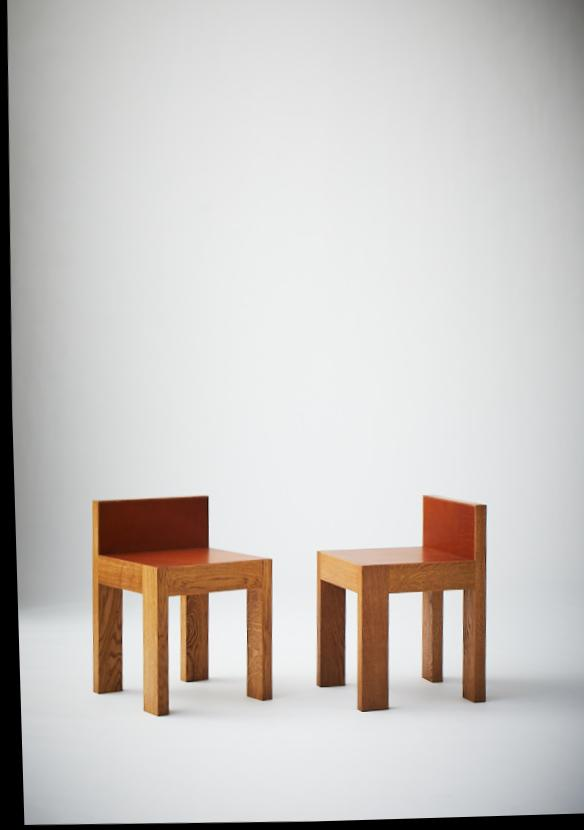

In [2]:
!pip install -q roboflow

from roboflow import download_dataset
from IPython.display import display
from PIL import Image
import glob

!curl -L "https://app.roboflow.com/ds/yZCg6UeAVt?key=xfaRvtJWlI" > roboflow.zip
!unzip -q roboflow.zip -d dataset && rm roboflow.zip

# visa första JPG/PNG i datasetet
first_img = glob.glob("dataset/train/*.[jp][pn]g")[0]
display(Image.open(first_img))


## **C. Train RF-DETR on custom dataset**

### Choose the right `batch_size`

Different GPUs have different amounts of VRAM (video memory), which limits how much data they can handle at once during training. To make training work well on any machine, you can adjust two settings: `batch_size` and `grad_accum_steps`.
These control how many samples are processed at a time.

In [ ]:
from rfdetr import RFDETRBase

model = RFDETRBase()
history = []

def callback2(data):
    history.append(data)

model.callbacks["on_fit_epoch_end"].append(callback2)

model.train(
    dataset_dir="dataset",
    epochs=4,
    batch_size=4,          # Adjust to reduce GPU load
    grad_accum_steps=8,
    lr=1e-4,
    resolution=448         # Adjust for more memory headroom
)



Loading pretrain weights


reinitializing your detection head with 34 classes.


Not using distributed mode
git:
  sha: N/A, status: clean, branch: N/A

Namespace(num_classes=34, grad_accum_steps=8, amp=True, lr=0.0001, lr_encoder=0.00015, batch_size=4, weight_decay=0.0001, epochs=4, lr_drop=100, clip_max_norm=0.1, lr_vit_layer_decay=0.8, lr_component_decay=0.7, do_benchmark=False, dropout=0, drop_path=0.0, drop_mode='standard', drop_schedule='constant', cutoff_epoch=0, pretrained_encoder=None, pretrain_weights='rf-detr-base.pth', pretrain_exclude_keys=None, pretrain_keys_modify_to_load=None, pretrained_distiller=None, encoder='dinov2_windowed_small', vit_encoder_num_layers=12, window_block_indexes=None, position_embedding='sine', out_feature_indexes=[2, 5, 8, 11], freeze_encoder=False, layer_norm=True, rms_norm=False, backbone_lora=False, force_no_pretrain=False, dec_layers=3, dim_feedforward=2048, hidden_dim=256, sa_nheads=8, ca_nheads=16, num_queries=300, group_detr=13, two_stage=True, projector_scale=['P4'], lite_refpoint_refine=True, num_select=300, dec_n_poin

Epoch: [0]  [  0/259]  eta: 1:23:26  lr: 0.000100  class_error: 100.00  loss: 22.8161 (22.8161)  loss_ce: 1.0331 (1.0331)  loss_bbox: 3.8342 (3.8342)  loss_giou: 0.7736 (0.7736)  loss_ce_0: 1.0125 (1.0125)  loss_bbox_0: 3.9334 (3.9334)  loss_giou_0: 0.7818 (0.7818)  loss_ce_1: 1.0156 (1.0156)  loss_bbox_1: 3.8951 (3.8951)  loss_giou_1: 0.8026 (0.8026)  loss_ce_enc: 1.0335 (1.0335)  loss_bbox_enc: 3.8994 (3.8994)  loss_giou_enc: 0.8014 (0.8014)  loss_ce_unscaled: 1.0331 (1.0331)  class_error_unscaled: 100.0000 (100.0000)  loss_bbox_unscaled: 0.7668 (0.7668)  loss_giou_unscaled: 0.3868 (0.3868)  cardinality_error_unscaled: 3849.2500 (3849.2500)  loss_ce_0_unscaled: 1.0125 (1.0125)  loss_bbox_0_unscaled: 0.7867 (0.7867)  loss_giou_0_unscaled: 0.3909 (0.3909)  cardinality_error_0_unscaled: 3898.2500 (3898.2500)  loss_ce_1_unscaled: 1.0156 (1.0156)  loss_bbox_1_unscaled: 0.7790 (0.7790)  loss_giou_1_unscaled: 0.4013 (0.4013)  cardinality_error_1_unscaled: 3877.0000 (3877.0000)  loss_ce_enc_

Test:  [  0/189]  eta: 0:02:23  class_error: 0.00  loss: 4.0970 (4.0970)  loss_ce: 0.4121 (0.4121)  loss_bbox: 0.2051 (0.2051)  loss_giou: 0.2146 (0.2146)  loss_ce_0: 0.6328 (0.6328)  loss_bbox_0: 0.1810 (0.1810)  loss_giou_0: 0.2099 (0.2099)  loss_ce_1: 0.4180 (0.4180)  loss_bbox_1: 0.2059 (0.2059)  loss_giou_1: 0.2179 (0.2179)  loss_ce_enc: 0.9336 (0.9336)  loss_bbox_enc: 0.2365 (0.2365)  loss_giou_enc: 0.2295 (0.2295)  loss_ce_unscaled: 0.4121 (0.4121)  class_error_unscaled: 0.0000 (0.0000)  loss_bbox_unscaled: 0.0410 (0.0410)  loss_giou_unscaled: 0.1073 (0.1073)  cardinality_error_unscaled: 298.0000 (298.0000)  loss_ce_0_unscaled: 0.6328 (0.6328)  loss_bbox_0_unscaled: 0.0362 (0.0362)  loss_giou_0_unscaled: 0.1049 (0.1049)  cardinality_error_0_unscaled: 298.0000 (298.0000)  loss_ce_1_unscaled: 0.4180 (0.4180)  loss_bbox_1_unscaled: 0.0412 (0.0412)  loss_giou_1_unscaled: 0.1090 (0.1090)  cardinality_error_1_unscaled: 298.0000 (298.0000)  loss_ce_enc_unscaled: 0.9336 (0.9336)  loss_b

## **D. Evaluate**

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

df = pd.DataFrame(history)

plt.figure(figsize=(12, 8))

plt.plot(
    df['epoch'],
    df['train_loss'],
    label='Training Loss',
    marker='o',
    linestyle='-'
)

plt.plot(
    df['epoch'],
    df['test_loss'],
    label='Validation Loss',
    marker='o',
    linestyle='--'
)

plt.title('Train/Validation Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.show()

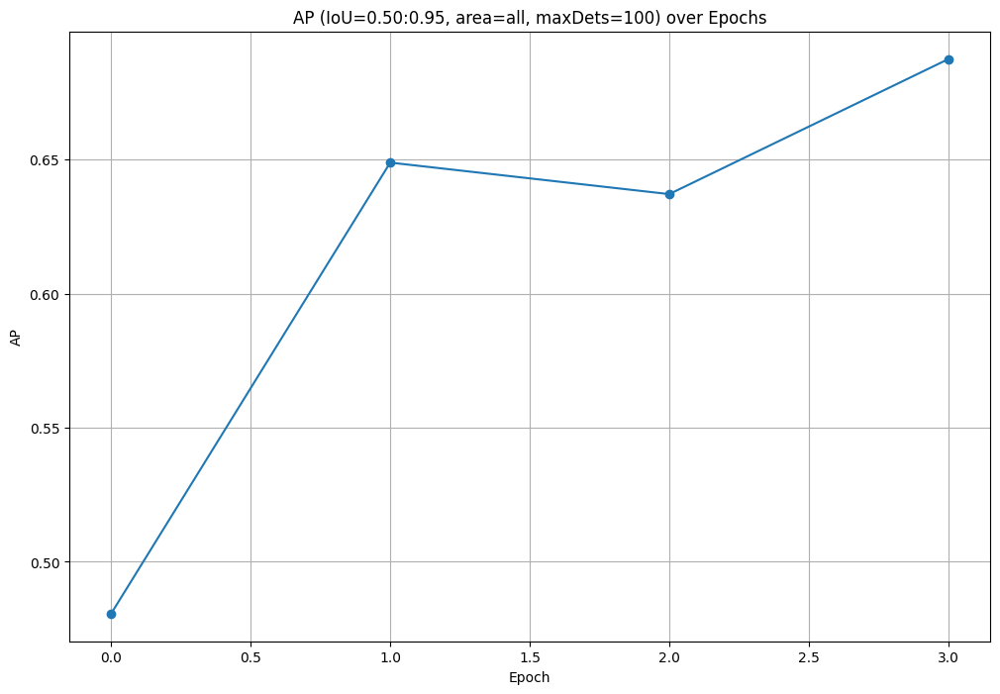

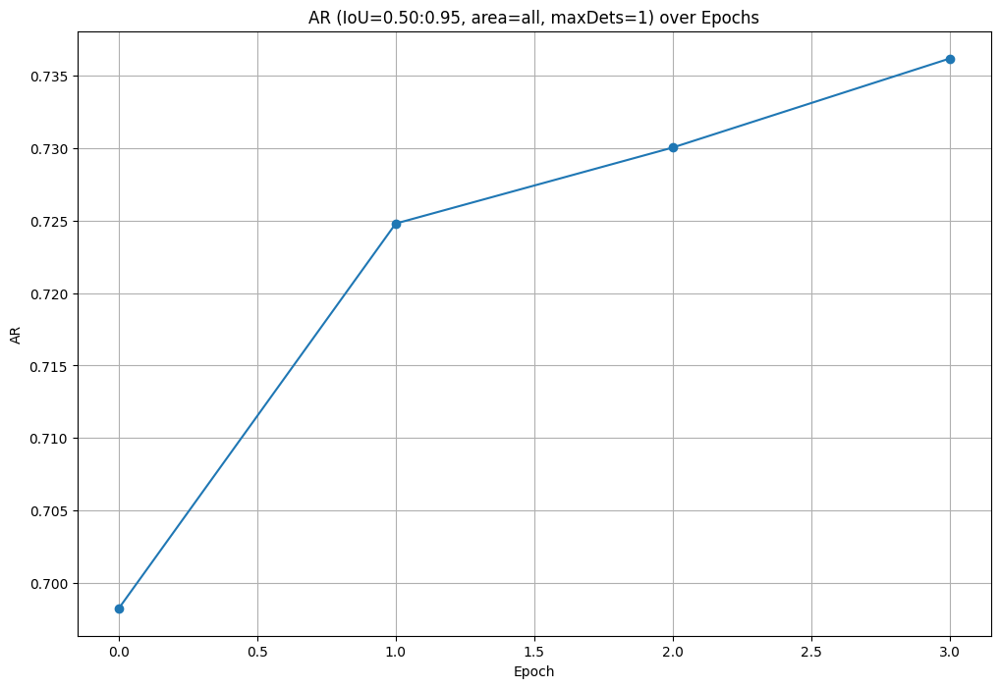

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

df = pd.DataFrame(history)

df['avg_precision'] = df['test_coco_eval_bbox'].apply(lambda arr: arr[0])
df['avg_recall'] = df['test_coco_eval_bbox'].apply(lambda arr: arr[6])

plt.figure(figsize=(12, 8))
plt.plot(
    df['epoch'],
    df['avg_precision'],
    marker='o',
    linestyle='-'
)
plt.title('AP (IoU=0.50:0.95, area=all, maxDets=100) over Epochs')
plt.xlabel('Epoch')
plt.ylabel('AP')
plt.grid(True)
plt.show()


plt.figure(figsize=(12, 8))
plt.plot(
    df['epoch'],
    df['avg_recall'],
    marker='o',
    linestyle='-'
)
plt.title('AR (IoU=0.50:0.95, area=all, maxDets=1) over Epochs')
plt.xlabel('Epoch')
plt.ylabel('AR')
plt.grid(True)
plt.show()

### Run inference with fine-tuned model

In [ ]:
import supervision as sv

ds = sv.DetectionDataset.from_coco(
    images_directory_path="/content/dataset/test",
    annotations_path="/content/dataset/test/_annotations.coco.json",
)



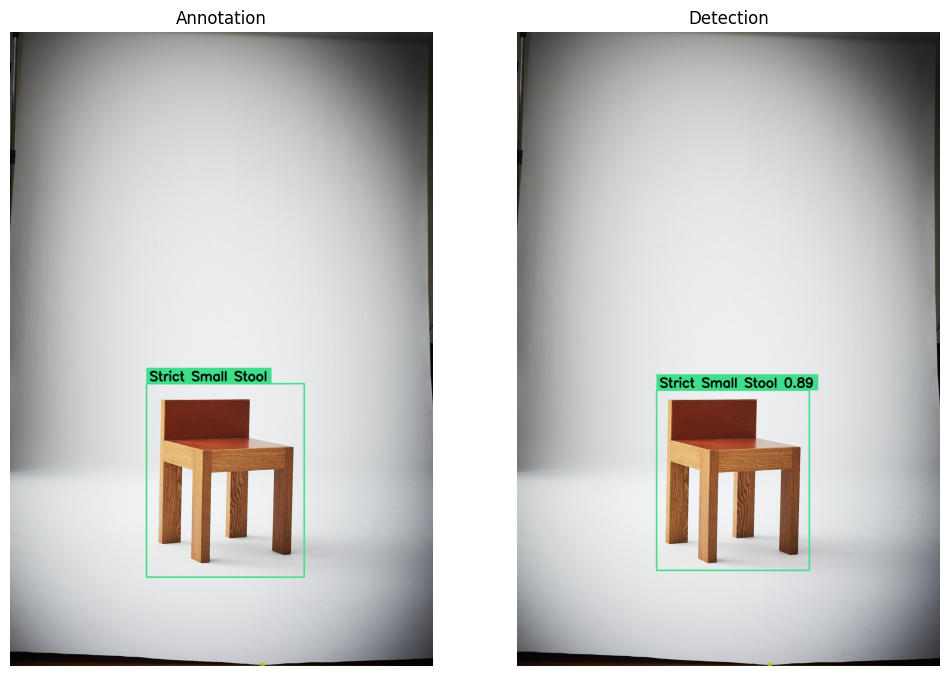

In [ ]:
from rfdetr import RFDETRBase
import supervision as sv
from PIL import Image

path, image, annotations = ds[0]
image = Image.open(path)

detections = model.predict(image, threshold=0.5)

text_scale = sv.calculate_optimal_text_scale(resolution_wh=image.size)
thickness = sv.calculate_optimal_line_thickness(resolution_wh=image.size)

bbox_annotator = sv.BoxAnnotator(thickness=thickness)
label_annotator = sv.LabelAnnotator(
    text_color=sv.Color.BLACK,
    text_scale=text_scale,
    text_thickness=thickness,
    smart_position=True)

annotations_labels = [
    f"{ds.classes[class_id]}"
    for class_id
    in annotations.class_id
]

detections_labels = [
    f"{ds.classes[class_id]} {confidence:.2f}"
    for class_id, confidence
    in zip(detections.class_id, detections.confidence)
]

annotation_image = image.copy()
annotation_image = bbox_annotator.annotate(annotation_image, annotations)
annotation_image = label_annotator.annotate(annotation_image, annotations, annotations_labels)

detections_image = image.copy()
detections_image = bbox_annotator.annotate(detections_image, detections)
detections_image = label_annotator.annotate(detections_image, detections, detections_labels)

sv.plot_images_grid(images=[annotation_image, detections_image], grid_size=(1, 2), titles=["Annotation", "Detection"])

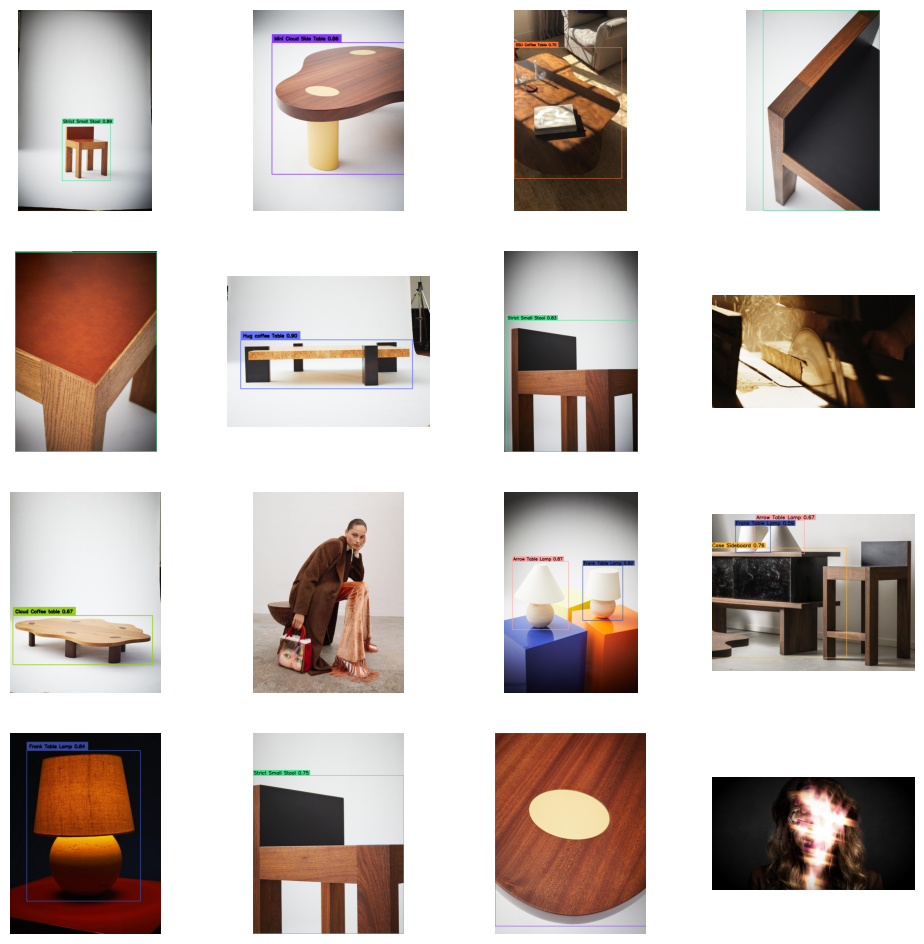

In [ ]:
import supervision as sv
from rfdetr import RFDETRBase
from PIL import Image

detections_images = []

for i in range(16):
    path, image, annotations = ds[i]
    image = Image.open(path)

    detections = model.predict(image, threshold=0.5)

    text_scale = sv.calculate_optimal_text_scale(resolution_wh=image.size)
    thickness = sv.calculate_optimal_line_thickness(resolution_wh=image.size)

    bbox_annotator = sv.BoxAnnotator(thickness=thickness)
    label_annotator = sv.LabelAnnotator(
        text_color=sv.Color.BLACK,
        text_scale=text_scale,
        text_thickness=thickness,
        smart_position=True)

    detections_labels = [
        f"{ds.classes[class_id]} {confidence:.2f}"
        for class_id, confidence
        in zip(detections.class_id, detections.confidence)
    ]

    detections_image = image.copy()
    detections_image = bbox_annotator.annotate(detections_image, detections)
    detections_image = label_annotator.annotate(detections_image, detections, detections_labels)

    detections_images.append(detections_image)

sv.plot_images_grid(images=detections_images, grid_size=(4, 4))

### MAP and Confusion Matrix

In [ ]:
import supervision as sv
from tqdm import tqdm
from supervision.metrics import MeanAveragePrecision

targets = []
predictions = []

for path, image, annotations in tqdm(ds):
    image = Image.open(path)
    detections = model.predict(image, threshold=0.5)

    targets.append(annotations)
    predictions.append(detections)

100%|██████████| 378/378 [00:35<00:00, 10.52it/s]


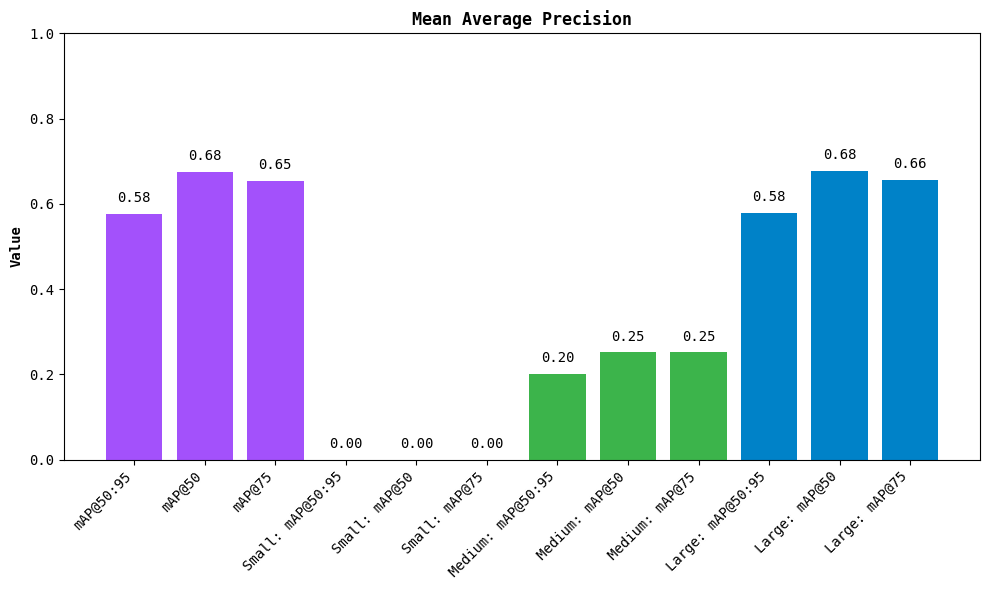

In [ ]:
map_metric = MeanAveragePrecision()
map_result = map_metric.update(predictions, targets).compute()

map_result.plot()

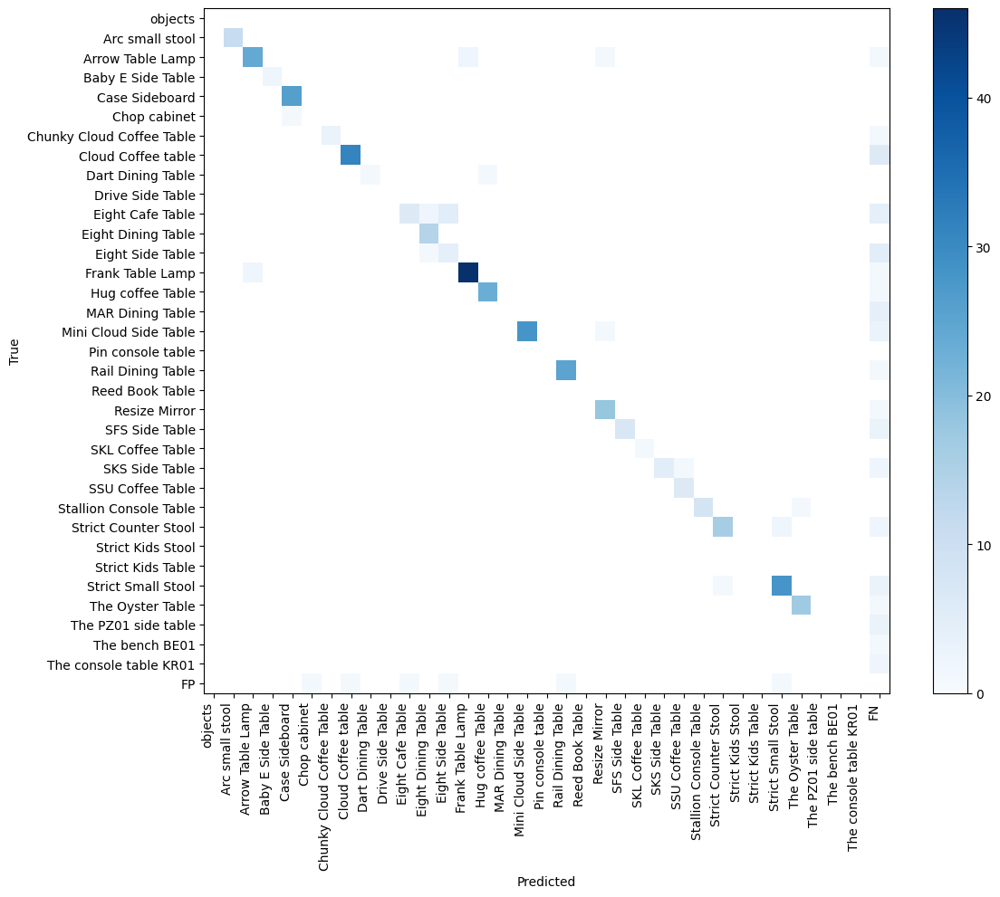

In [ ]:
confusion_matrix = sv.ConfusionMatrix.from_detections(
    predictions=predictions,
    targets=targets,
    classes=ds.classes
)

_ = confusion_matrix.plot()

## **E. 40 Images Test**

### Downoad 40 images from public drive

In [9]:
!pip install -q gdown

# Download all files (large sizee)
!gdown --folder --id 1PFUJiwChI9ihA-c6qME2sMUdqRtcgW4v -O 40images

# Control at last that we have 40
!ls 40images | head
print("NUMBER OF FILES:", len(os.listdir("40images")))

IMAGE_DIR = "/content/40images"


/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Retrieving folder contents
Processing file 1NW07eIciWiecyzABtP9REM5taN1exWpI Skärmavbild 2025-05-22 kl. 17.49.32.png
Processing file 1EgTsyBiUVwQzE_9fFRNdDjN6TPqBGQlp Skärmavbild 2025-05-22 kl. 17.49.54.png
Processing file 12S2zGEpjhQnEg0zYOV7DKc19S02XNqbr Skärmavbild 2025-05-22 kl. 17.50.12.png
Processing file 1QqmMe5NQsLZ679XR9K_2TPU01jucgcs5 Skärmavbild 2025-05-22 kl. 17.50.52.png
Processing file 12L2KAdAq22nJgmIStWEq621zCzYc3eMH Skärmavbild 2025-05-22 kl. 17.51.09.png
Processing file 1pMKi920roLLILw1USCuVigQY5SzUXBZG Skärmavbild 2025-05-22 kl. 17.51.25.png
Processing file 1hWTWq9tT_iKhB9-15aE_-ndAiCxSz5Jc Skärmavbild 2025-05-22 kl. 17.51.42.png
Processing file 1dVpKT7CoRil_rvem4ukhJIDCoUPaGgWB Skärmavbild 2025-05-22 kl. 17.52.07.png
Processing file 1pMXxLo4

### Download fine-tuned model

In [66]:
!pip install -q gdown

# Download the correct checkpoint file using the file ID
!gdown --id 1Oga42wwaQ36YhOB8I-9BFagbZRD1XSDc -O /content/checkpoint_best_total.pth

# Verify the file size
!ls -lh /content/checkpoint_best_total.pth

/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1Oga42wwaQ36YhOB8I-9BFagbZRD1XSDc
From (redirected): https://drive.google.com/uc?id=1Oga42wwaQ36YhOB8I-9BFagbZRD1XSDc&confirm=t&uuid=5c353d42-2d29-4a52-8372-c30840795fca
To: /content/checkpoint_best_total.pth
100% 370M/370M [00:05<00:00, 70.4MB/s]
-rw-r--r-- 1 root root 353M May 25 11:49 /content/checkpoint_best_total.pth


### Check if classes are imported

In [10]:
import json, pprint

# Open annotationsfile
with open("dataset/train/_annotations.coco.json") as f:
    coco = json.load(f)

# Build dict id → name
id2name = {cat["id"]: cat["name"] for cat in coco["categories"]}
class_names = [id2name[i] for i in sorted(id2name)]
print(class_names)


{0: 'objects',
 1: 'Arc small stool',
 2: 'Arrow Table Lamp',
 3: 'Baby E Side Table',
 4: 'Case Sideboard',
 5: 'Chop cabinet',
 6: 'Chunky Cloud Coffee Table',
 7: 'Cloud Coffee table',
 8: 'Dart Dining Table',
 9: 'Drive Side Table',
 10: 'Eight Cafe Table',
 11: 'Eight Dining Table',
 12: 'Eight Side Table',
 13: 'Frank Table Lamp',
 14: 'Hug coffee Table',
 15: 'MAR Dining Table',
 16: 'Mini Cloud Side Table',
 17: 'Pin console table',
 18: 'Rail Dining Table',
 19: 'Reed Book Table',
 20: 'Resize Mirror',
 21: 'SFS Side Table',
 22: 'SKL Coffee Table',
 23: 'SKS Side Table',
 24: 'SSU Coffee Table',
 25: 'Stallion Console Table',
 26: 'Strict Counter Stool',
 27: 'Strict Kids Stool',
 28: 'Strict Kids Table',
 29: 'Strict Small Stool',
 30: 'The Oyster Table',
 31: 'The PZ01 side table',
 32: 'The bench BE01',
 33: 'The console table KR01'}
['objects', 'Arc small stool', 'Arrow Table Lamp', 'Baby E Side Table', 'Case Sideboard', 'Chop cabinet', 'Chunky Cloud Coffee Table', 'Cloud

### Run 40 images test

In [52]:
!pip install -q torchvision

✓ checkpoint contains 34 classes
Loading pretrain weights
✓ weights loaded & model fully on CPU
✓ found 40 images

✅  All done – annotated images + CSV are in: /content/rfdetr_test40


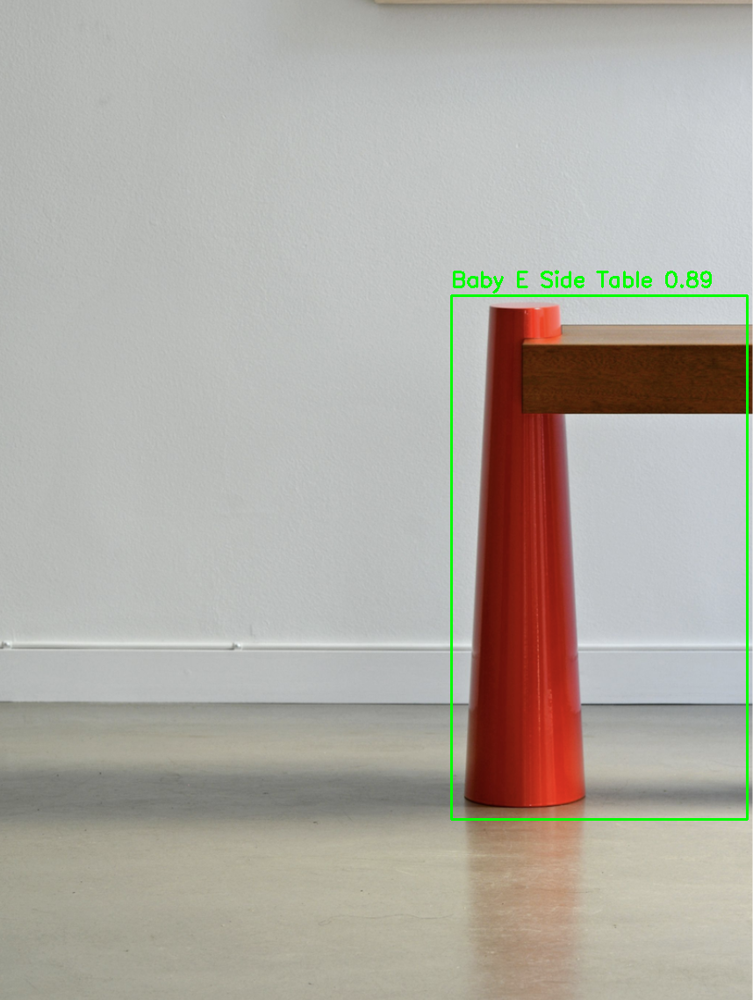

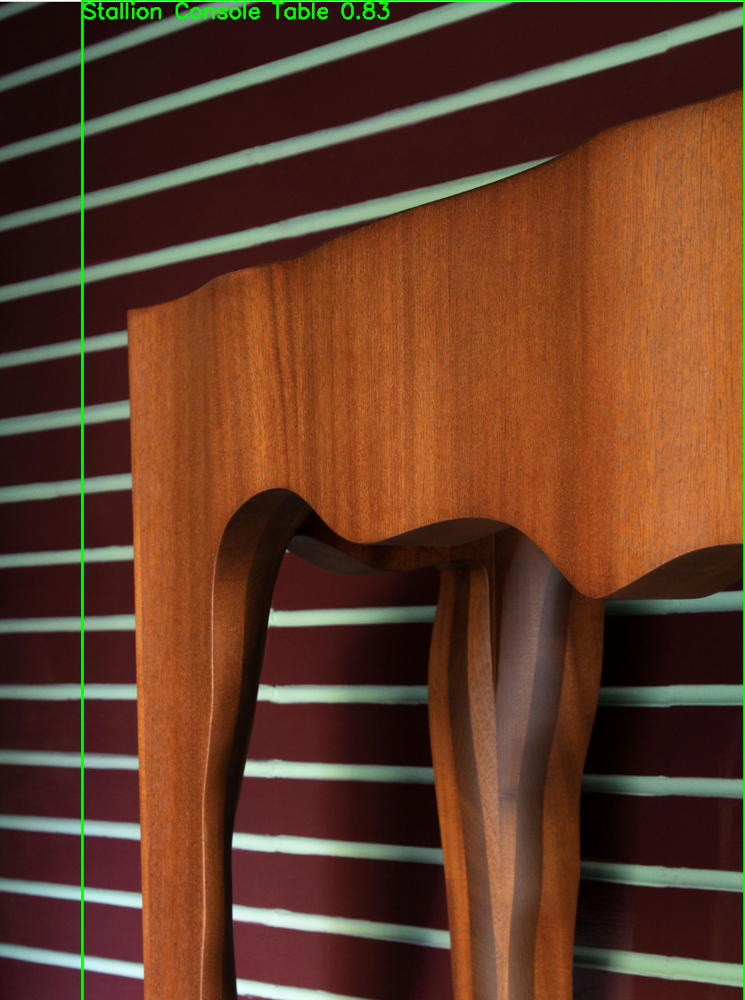

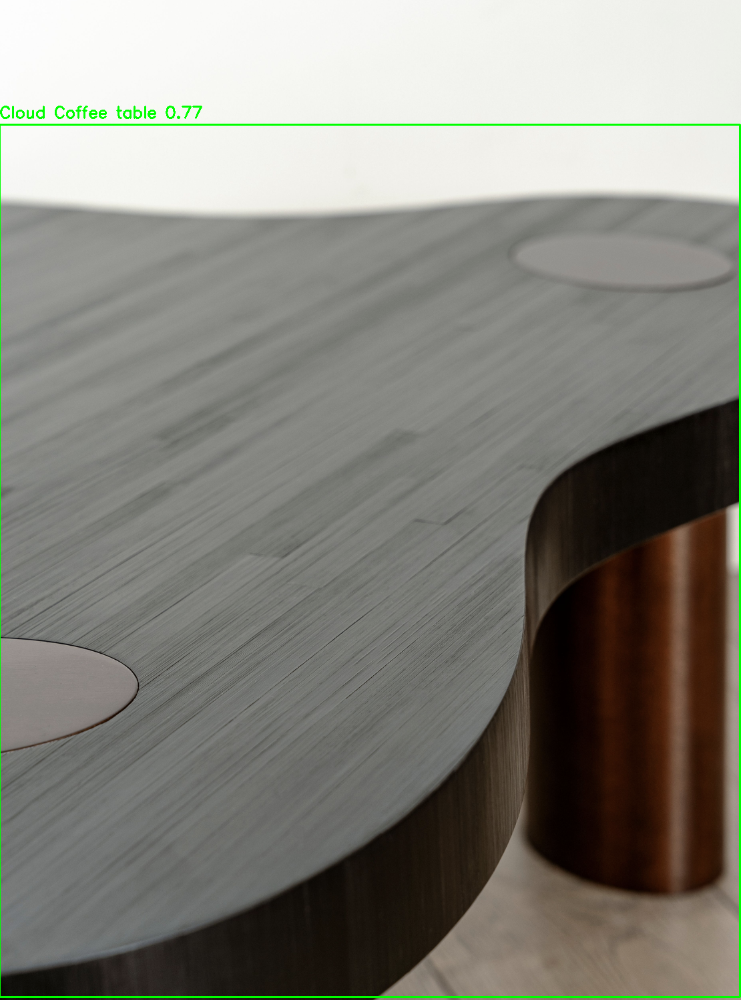

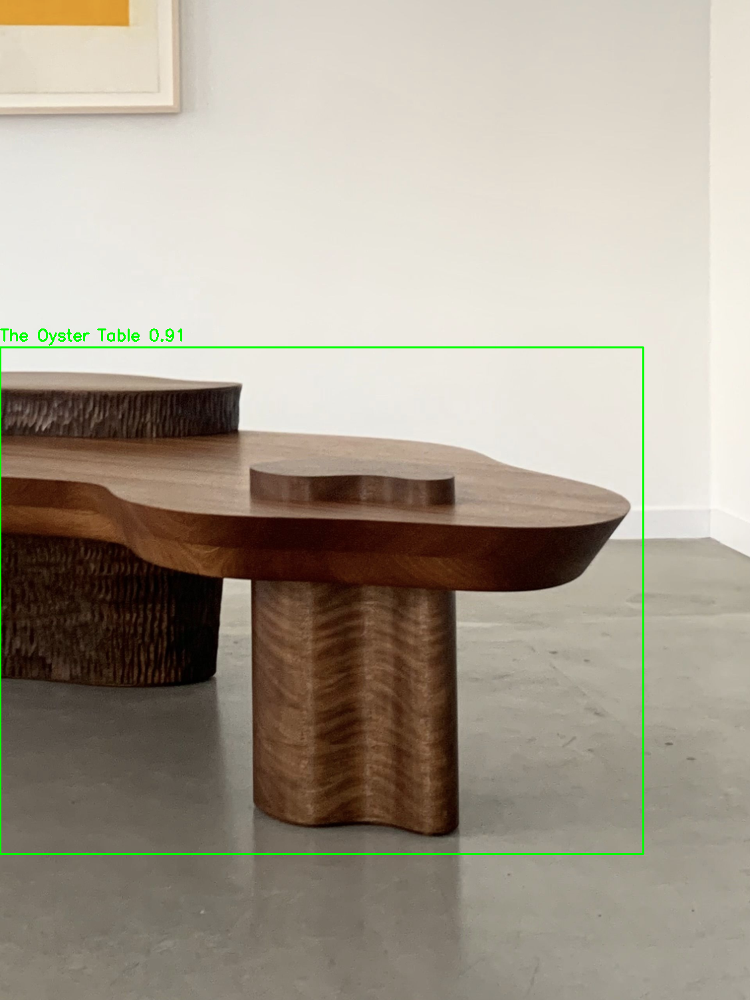

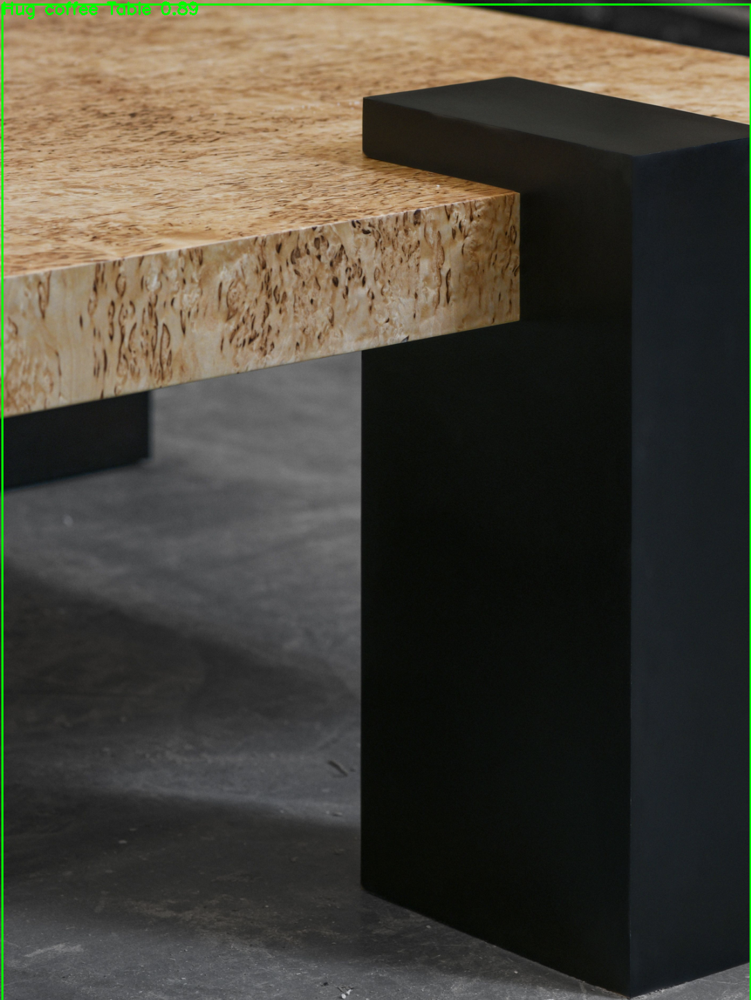

In [67]:
# ╭────────────  ONLY CHANGE THESE TWO  ───────────╮
CKPT_PATH  = "/content/checkpoint_best_total.pth"     # <- weight file (.pth)
IMG_FOLDER = "/content/40images"                      # <- folder with 40 images
# ╰───────────────────────────────────────────────────╯

!pip install -q rfdetr==1.1.0 opencv-python supervision

import os, json, glob, cv2, torch, torch.nn as nn, numpy as np, pandas as pd
from PIL import Image
from IPython.display import display
from rfdetr import RFDETRBase

# 1 ── Read class names from your COCO JSON ───────────────────────────
with open("dataset/train/_annotations.coco.json") as f:
    ID2NAME = {c["id"]: c["name"] for c in json.load(f)["categories"]}

# 2 ── Load checkpoint and determine number of classes (34) ───────────
state = torch.load(CKPT_PATH, map_location="cpu")["model"]
n_cls  = state["class_embed.weight"].shape[0]
print("✓ checkpoint contains", n_cls, "classes")

# 3 ── Create RF-DETRBase (comes with 91-class head) ──────────────
wrapper = RFDETRBase()                # Lightning wrapper
core    = wrapper.model.model         # raw nn.Module

# 4 ── Shrink all Linear heads from 91 → 34 before loading weights ───
def shrink(mod: nn.Linear):
    new = nn.Linear(mod.in_features, n_cls)
    with torch.no_grad():
        new.weight[:] = mod.weight[:n_cls]
        new.bias[:]   = mod.bias[:n_cls]
    return new

def set_module(root, dotted, new_mod):
    *parents, last = dotted.split(".")
    for p in parents:
        root = getattr(root, p)
    setattr(root, last, new_mod)

for name, mod in list(core.named_modules()):
    if isinstance(mod, nn.Linear) and mod.out_features == 91 \
       and "class_embed" in name:
        set_module(core, name, shrink(mod))

# 5 ── Load your weights and lock the model on CPU ──────────────────
core.load_state_dict(state, strict=True)
core.to("cpu").eval()                       # move weights to CPU
wrapper.model.device = torch.device("cpu")  # **IMPORTANT** for predict()
print("✓ weights loaded & model fully on CPU")

# 6 ── Inference, visualization, and CSV logging ───────────────────────
OUT_DIR = "/content/rfdetr_test40"
os.makedirs(OUT_DIR, exist_ok=True)
records = []

img_paths = sorted(sum([glob.glob(f"{IMG_FOLDER}/*{ext}")
                        for ext in ('.png', '.jpg', '.jpeg')], []))
print("✓ found", len(img_paths), "images")

for p in img_paths:
    pil = Image.open(p).convert("RGB")
    det = wrapper.predict(pil, threshold=0.3)   # now it works

    img = cv2.cvtColor(np.array(pil), cv2.COLOR_RGB2BGR)
    for box, conf, cid in zip(det.xyxy, det.confidence, det.class_id):
        x1, y1, x2, y2 = map(int, box.tolist())
        label = ID2NAME.get(int(cid), str(int(cid)))
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(img, f"{label} {conf:.2f}",
                    (x1, max(20, y1 - 10)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
        records.append(dict(
            filename=os.path.basename(p),
            class_id=int(cid),
            label=label,
            confidence=float(conf),
            x1=x1, y1=y1, x2=x2, y2=y2
        ))

    cv2.imwrite(os.path.join(OUT_DIR, os.path.basename(p)), img)

# 7 ── Save CSV and show a quick preview ───────────────────────────
csv_path = os.path.join(OUT_DIR, "test40_results.csv")
pd.DataFrame(records).to_csv(csv_path, index=False)

print("\n✅  All done – annotated images + CSV are in:", OUT_DIR)
for p in sorted(glob.glob(f"{OUT_DIR}/*"))[:5]:
    display(Image.open(p))